<a href="https://colab.research.google.com/github/conq44/Guitar-emulation/blob/master/Amp_Emulation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# this mounts your Google Drive to the Colab VM.
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

FOLDERNAME = 'guitar emulation project'
assert FOLDERNAME is not None, "[!] Enter the foldername."

import sys
sys.path.append('/content/drive/{}'.format(FOLDERNAME))

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
%cd drive/My Drive/guitar emulation project


/content/drive/My Drive/guitar emulation project


In [ ]:
import tensorflow as tf
import tensorflow.keras as keras
import numpy as np
import matplotlib.pyplot as plt
import librosa
import wave
import scipy.io.wavfile as wavfile
from IPython.display import Audio
import sklearn

#importing the loss helper functions
from loss_fn import loss_fn
from loss_fn import loss_fn_2

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0)

%load_ext autoreload
%autoreload 2


In [ ]:
_,x= wavfile.read('/content/drive/My Drive/guitar emulation project/data/clean/clean_full_5.wav')
_,y = wavfile.read('/content/drive/My Drive/guitar emulation project/data/distorted/distorted_5.wav')
print(x.shape)
print(y.shape)


(4699025,)
(4699025,)


In [ ]:
#split into training and validation
train_ratio = 0.8
x_t = x[:int(len(x)*train_ratio)]
y_t = y[:int(len(y)*train_ratio)]
x_v = x[int(len(x)*train_ratio):]
y_v = y[int(len(y)*train_ratio):]


print('train shape is:\n',x_t.shape, y_t.shape,'\n', 'val shape is:\n', x_v.shape, y_v.shape)

train shape is:
 (3759220,) (3759220,) 
 val shape is:
 (939805,) (939805,)


In [ ]:
#distorted sound clip
data = y_t
framerate = 44100
Audio(data,rate=framerate)

In [ ]:
#load training data and make 0.5 second segments then shuffle


def get_dataset(x,y, sequence_length):
  #split into 0.5sec intervales which translates to 22050 elements @44.1 kHz
  sequence_length  = sequence_length
  num_rows = x.shape[0]//sequence_length
  x = np.reshape(x[:sequence_length*num_rows], (num_rows,-1))
  y = np.reshape(y[:sequence_length*num_rows], (num_rows,-1))
  # print(x.shape)


  #reshaping into ( _ , num_batches, temporal_size, feature_size = 1) where the
  #first element depends on the size of the data 
  batch_size = 40
  num_batches = x.shape[0]//batch_size
  # print(num_batches)
  x = np.reshape(x[:num_batches*batch_size, :], (num_batches, batch_size, sequence_length,1))
  y = np.reshape(y[:num_batches*batch_size,:], (num_batches, batch_size, sequence_length,1))

  # x = np.reshape(x[:num_batches*batch_size, :], (-1, sequence_length,1))
  # y = np.reshape(y[:num_batches*batch_size,:], (-1,sequence_length,1))

  print(x.shape)
  print(y.shape)
  return x,y

sequence_length = 200
x_train,y_train = get_dataset(x_t,y_t, sequence_length)
x_val,y_val = get_dataset(x_v,y_v, sequence_length)

# shuffling the file to reduce connectivity between adjacent segments
print(len(x_train))
shuffler = np.random.permutation(len(x_train))
x_train = x_train[shuffler]
y_train = y_train[shuffler]

(469, 40, 200, 1)
(469, 40, 200, 1)
(117, 40, 200, 1)
(117, 40, 200, 1)
469


In [ ]:
#checking if reshaping gives the audio clip back
data = np.reshape(y_val, (-1,))
print(data.shape)
framerate = 44100
Audio(data,rate=framerate)

(936000,)


In [ ]:
#build model
def build_model():
  model = keras.Sequential()
  model.add(keras.layers.LSTM(96, input_shape = (sequence_length,1), return_sequences = True))
  model.add(keras.layers.Dense(1))
  # model.summary()
  return model

In [ ]:
#checking loss function
print(x_val.shape)
y_pred_sample = x_val

print(loss_fn(y_val[0], y_pred_sample[0]))
print(np.mean(loss_fn(y_val[1], y_pred_sample[1])))

(117, 40, 200, 1)
tf.Tensor(
[[1.793815  ]
 [1.575417  ]
 [1.6932188 ]
 [1.5987332 ]
 [1.7214476 ]
 [1.6141402 ]
 [1.688113  ]
 [1.5141546 ]
 [1.6107554 ]
 [1.7339742 ]
 [1.6245023 ]
 [1.5860091 ]
 [1.5658101 ]
 [1.9468722 ]
 [1.4106015 ]
 [0.9479508 ]
 [1.1032145 ]
 [1.0205927 ]
 [0.8984642 ]
 [0.8852588 ]
 [0.90114415]
 [0.9260194 ]
 [0.9255262 ]
 [0.85552585]
 [1.7698934 ]
 [1.1902211 ]
 [0.87742907]
 [2.0927541 ]
 [1.0503442 ]
 [2.3967662 ]
 [1.406862  ]
 [2.717551  ]
 [1.0461736 ]
 [1.1984437 ]
 [1.2436526 ]
 [1.5886984 ]
 [1.3991615 ]
 [1.2249702 ]
 [1.0229214 ]
 [0.8875072 ]], shape=(40, 1), dtype=float32)
1.0106617


In [ ]:
USE_GPU = True

if USE_GPU:
    device = '/device:GPU:0'
else:
    device = '/cpu:0'

In [ ]:
N,B,T,F = x_train.shape
M,B,T,F = x_val.shape
x_t = np.reshape(x_train, (N*B,T,F))
y_t = np.reshape(y_train, (N*B,T,F))
x_v = np.reshape(x_val, (M*B,T,F))
y_v = np.reshape(y_val, (M*B,T,F))

In [ ]:
"""redundant code to find best learning rate"""
# batch_size = 200

# def get_loss(batch,lr):
#     #get_batch of data
   
#     x_batch = x_t[(batch-1)*batch_size:batch*batch_size]
#     y_batch = y_t[(batch-1)*batch_size:batch*batch_size]
#     model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
#               loss= loss_fn,
#               metrics=[tf.keras.metrics.sparse_categorical_accuracy])
#     history = model.fit(x_batch, y_batch,epochs = 5,verbose = False)
#     loss = history.history['loss']
#     return loss 

# start_lr = 0.0001
# end_lr = 0.01
# num_batches = y_t.shape[0]//batch_size
# cur_lr = start_lr
# lr_multiplier = (end_lr / start_lr) ** (1.0 / num_batches)
# losses = []
# lrs = []
# for i in range(1,num_batches):
#     loss = get_loss(i,cur_lr)
#     losses.append(loss)
#     lrs.append(cur_lr)
#     cur_lr = cur_lr*lr_multiplier # increase LR
# plt.plot(lrs,losses)

# lr_list = [5e-3, 1e-3, 8e-4, 5e-4, 1e-4]
# for lr in lr_list:
#   model = build_model()
#   model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
#               loss= loss_fn)
#   history = model.fit(x_t, y_t, batch_size = 40, epochs = 10,verbose = True)
#   loss = history.history['loss']
#   plt.plot(loss, label = str(lr))
#   plt.legend(loc="upper right")

In [ ]:
learning_rate = 5e-4

In [ ]:
model = build_model()
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 200, 96)           37632     
_________________________________________________________________
dense_1 (Dense)              (None, 200, 1)            97        
Total params: 37,729
Trainable params: 37,729
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
#training
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss= loss_fn,
              metrics=[tf.keras.metrics.sparse_categorical_accuracy])
history = model.fit(x_t, y_t, batch_size= 40 , epochs=300, validation_data=(x_v, y_v))
# model.evaluate(X_test, y_test)

Epoch 1/300
469/469 [==============================] - 24s 50ms/step - loss: 0.9686 - sparse_categorical_accuracy: 0.0135 - val_loss: 0.9913 - val_sparse_categorical_accuracy: 0.0242
Epoch 2/300
469/469 [==============================] - 23s 49ms/step - loss: 0.9145 - sparse_categorical_accuracy: 0.0135 - val_loss: 0.9385 - val_sparse_categorical_accuracy: 0.0242
Epoch 3/300
469/469 [==============================] - 23s 49ms/step - loss: 0.8798 - sparse_categorical_accuracy: 0.0135 - val_loss: 0.9075 - val_sparse_categorical_accuracy: 0.0242
Epoch 4/300
469/469 [==============================] - 23s 48ms/step - loss: 0.8568 - sparse_categorical_accuracy: 0.0135 - val_loss: 0.8929 - val_sparse_categorical_accuracy: 0.0242
Epoch 5/300
469/469 [==============================] - 23s 48ms/step - loss: 0.8396 - sparse_categorical_accuracy: 0.0135 - val_loss: 0.8894 - val_sparse_categorical_accuracy: 0.0242
Epoch 6/300
469/469 [==============================] - 23s 48ms/step - loss: 0.8277 -

In [ ]:
plt.plot(history.history['loss'])

plt.xlabel('Epoch')
plt.ylabel('loss')

plt.legend(loc='upper right')

NameError: ignored

In [ ]:
#model output of the validation audio clip

print(x_val.shape)
out = model.predict(x_v)
print(out.shape)

(117, 40, 200, 1)
(4680, 200, 1)


In [ ]:
data_true = np.reshape(y_v, (-1,))
framerate = 44100
Audio(data_true,rate=framerate)

In [ ]:
data_predict = out.flatten()
framerate = 44100
Audio(data_predict,rate=framerate)

In [ ]:
data = np.reshape(x_val, (-1,))
framerate = 44100
Audio(data,rate=framerate)

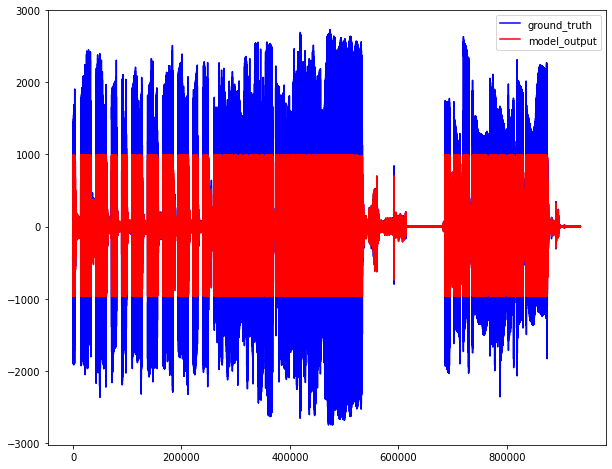

In [ ]:
#predict and plot results

plt.plot(data_true, "-b", label="ground_truth")
plt.plot(data_predict, "-r", label="model_output")
# plt.plot(data, "-g", label = "model_input")
plt.legend(loc="upper right")

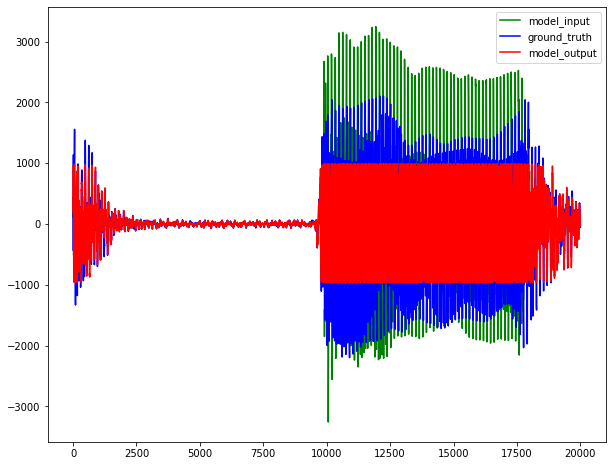

In [ ]:
#predict and plot results
plt.plot(data[80000:100000], "-g", label = "model_input")
plt.plot(data_true[80000:100000], "-b", label="ground_truth")
plt.plot(data_predict[80000:100000], "-r", label="model_output")
plt.legend(loc="upper right")


Text(0, 0.5, 'Amplitude')

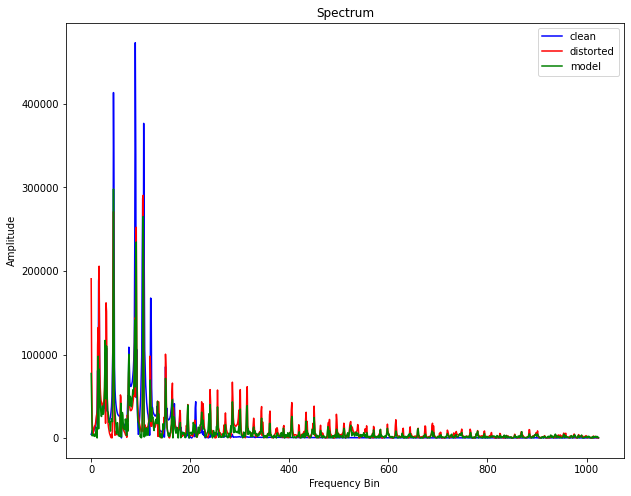

In [ ]:
#fft plot

n_fft = 2048
data = data.astype(float)
data_true = data_true.astype(float)
data_predict = data_predict.astype(float)
ft_clean = np.abs(librosa.stft(data[:n_fft], hop_length = n_fft+1))
ft_distorted = np.abs(librosa.stft(data_true[:n_fft], hop_length = n_fft+1))
ft_model_clipped = np.abs(librosa.stft(data_predict[:n_fft], hop_length = n_fft+1))

plt.plot(ft_clean,"-b", label="clean")
plt.plot(ft_distorted,"-r", label="distorted")
plt.plot(ft_model_clipped,"-g", label="model")
plt.legend(loc="upper right")
plt.title('Spectrum')
plt.xlabel('Frequency Bin')
plt.ylabel('Amplitude')

In [ ]:
#save python files

import os

FOLDER_TO_SAVE = os.path.join('drive/My Drive/', FOLDERNAME)
FILES_TO_SAVE = []

for files in FILES_TO_SAVE:
    with open(os.path.join(FOLDER_TO_SAVE, '/'.join(files.split('/')[1:])), 'w') as f:
        f.write(''.join(open(files).readlines()))